In [1]:
import cv2
import skimage.filters as filters
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

## Create mask, img tiff stack, opening, closing


np.mashgrid

In [2]:
from scipy import ndimage as nd
nd.binary_closing
nd.binary_opening

<function scipy.ndimage.morphology.binary_opening(input, structure=None, iterations=1, output=None, origin=0, mask=None, border_value=0, brute_force=False)>

## Import Image and Define Functions
skimage could be slower than OpenCV

In [3]:
# compare plots
def com_plots(img1,img2, title=''):
    '''compare two image side by side'''
    plt.figure(figsize=(10,20))
    plt.subplot(1,2,1); plt.title('Original')
    plt.imshow(img1)
    plt.subplot(1,2,2)
    plt.title(title)
    plt.imshow(img2)

(229, 259)


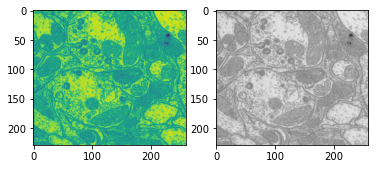

In [4]:
img = cv2.imread('/Users/livi/Git/Image-Processing/Image from Kaggle/bio_low_contrast.jpg',0)
img_color = cv2.imread('/Users/livi/Git/Image-Processing/Image from Kaggle/bio_low_contrast.jpg')
print(img.shape)
plt.subplot(1,2,1); plt.imshow(img)
plt.subplot(1,2,2); plt.imshow(img_color)

## Color Space Choice

BGR: default for OpenCV

RGB: default for skimage

HSV: Hue, saturation, valus; seperate image intensity (luma) from color (chroma); use when want to chhange only intensity/color eg.histogram equalization


LAB: lightness, color channel A (green to red), color space B (blue to yellow)


(cv2.split, cv2.merge)

### gray scale filter apply to color image

In [5]:
fluorescecne = cv2.cvtColor(cv2.imread('./Image from Kaggle/test_image_cropped.jpg'), cv2.COLOR_BGR2RGB)
#fluorescecne = cv2.cvtColor( cv2.imread('./Image from Kaggle/einstein_mona_lisa/monalisa/monalisa_flip_H.jpg'), cv2.COLOR_BGR2RGB)

In [6]:
# apply on each RGB layer
R, B, G = cv2.split(fluorescecne)
RGB_equalize = cv2.merge([cv2.equalizeHist(layer) for layer in [R, B, G]])

# apply on value layer only
H, S, V = cv2.split( cv2.cvtColor(fluorescecne, cv2.COLOR_RGB2HSV) )
HSV_equalize = cv2.cvtColor( cv2.merge([H,S, cv2.equalizeHist(V)]), cv2.COLOR_HSV2RGB )

# apply on value layer only
L, A, B = cv2.split( cv2.cvtColor(fluorescecne, cv2.COLOR_RGB2LAB) )
LAB_equalize = cv2.cvtColor( cv2.merge([cv2.equalizeHist(L), A, B]), cv2.COLOR_LAB2RGB )

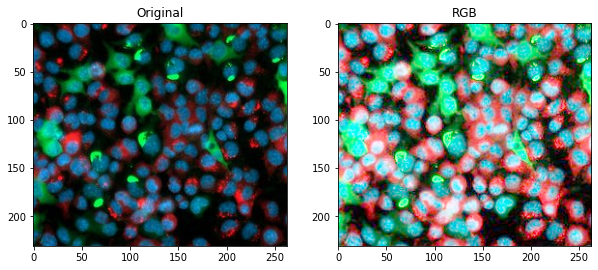

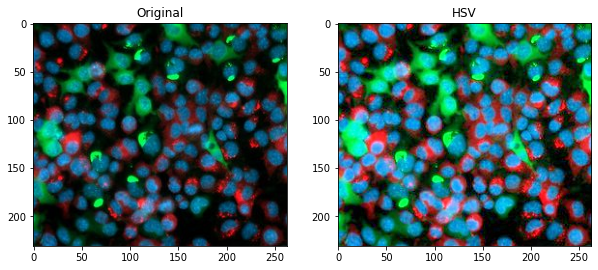

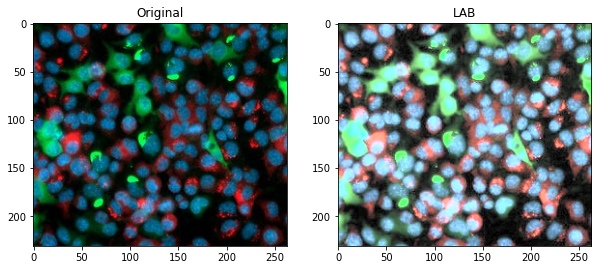

In [7]:
com_plots(fluorescecne, RGB_equalize, 'RGB')
com_plots(fluorescecne, HSV_equalize, 'HSV')
com_plots(fluorescecne, LAB_equalize, 'LAB')

## Common Operations

### Clear border

for binary image

In [8]:
from skimage.segmentation import clear_border

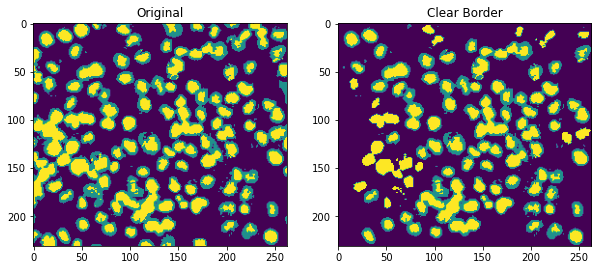

In [9]:
G_threshholds = filters.threshold_multiotsu(G)
img_border= np.digitize(G, bins = G_threshholds)
img_clear_border = clear_border(img_border)
com_plots(img_border, img_clear_border, 'Clear Border')

In [11]:
#min_val, max_val, min_loc, max_loc = cv2.minMaxLoc() # gives back the location that corresponding to the minimum and max values

## Denoising

filter for noise removal

salt-pepper (electronic noise): median

Gaussian noise: gaussian

preserve edge: NLM, biliteral

Reference:
[1] https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html

### Estimate noise of an image

In [12]:
from skimage.restoration import estimate_sigma
estimate_sigma(img)

7.331871576808615

### Averaging

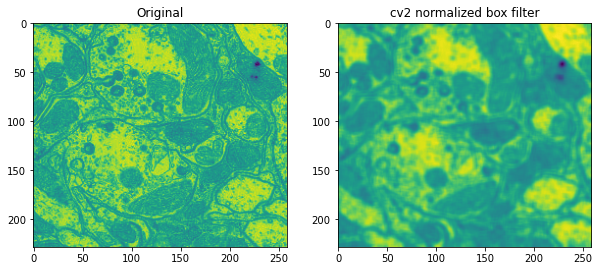

In [13]:
cv_img_blur = cv2.blur(img,(5,5))
com_plots(img, cv_img_blur,'cv2 normalized box filter')

### Gaussian Filter

skimage:

mode{‘reflect’, ‘constant’, ‘nearest’, ‘mirror’, ‘wrap’}, optional

The mode parameter determines how the array borders are handled, where cval is the value when mode is equal to ‘constant’. Default is ‘nearest’.

CV2:

- Specify the width and height of the kernel which should be **positive** and **odd**

- Standard deviation in the X and Y directions, sigmaX and sigmaY

- highly effective in **removing Gaussian noise** from an image.



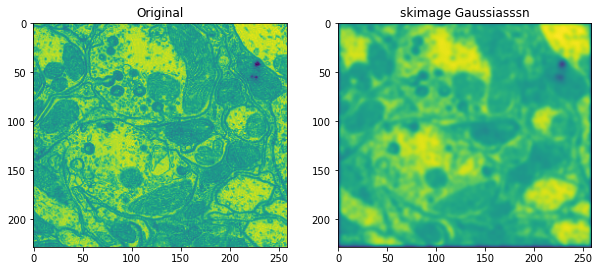

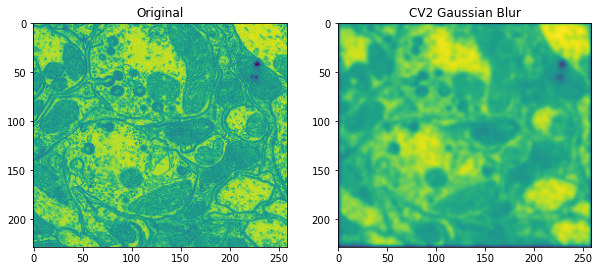

In [14]:
gaussian_img = filters.gaussian(img, sigma=2, mode='constant', cval=0.0)
com_plots(img,gaussian_img,'skimage Gaussiasssn')
cv_img_gaussian = cv2.GaussianBlur(img, sigmaX=2,ksize=(5,5), borderType=cv2.BORDER_CONSTANT)
com_plots(img,gaussian_img,'CV2 Gaussian Blur')

### Median Filter

- highly effective against **salt-and-pepper noise** in an image. 

- in median blurring, the central element is always replaced by some pixel value in the image. It reduces the noise effectively. 

- Its kernel size should be a **positive odd** integer.

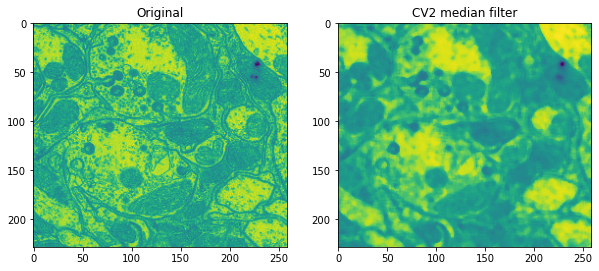

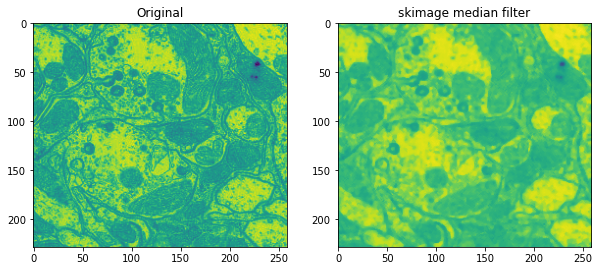

In [15]:
cv_img_medianBlur = cv2.medianBlur(img, 5)
com_plots(img, cv_img_medianBlur,'CV2 median filter')

from skimage.morphology import disk
median_img = filters.median(img, disk(2), mode='constant', cval=0.0)
com_plots(img, median_img,'skimage median filter')

### Bilateral Filtering

- Highly effective in noise removal while keeping edges sharp, but slower compared to other filters (nearby pixels are considere, doesn't consider whether pixels have same intensity, doesn't consider whether a pixel is an edge pixel or not)

- Bilateral filtering also takes a Gaussian filter in space, but one more Gaussian filter which is a function of pixel difference. The **Gaussian function of space** makes sure that only nearby pixels are considered for blurring, while the **Gaussian function of intensity difference** makes sure that only those pixels with similar intensities to the central pixel are considered for blurring. So it preserves the edges since pixels at edges will have large intensity variation.


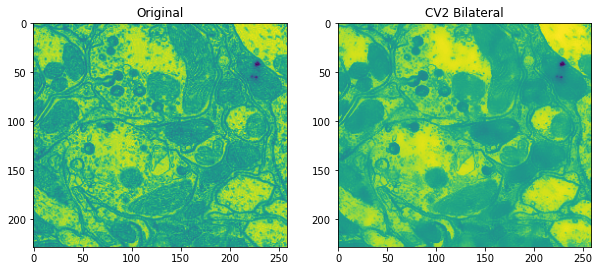

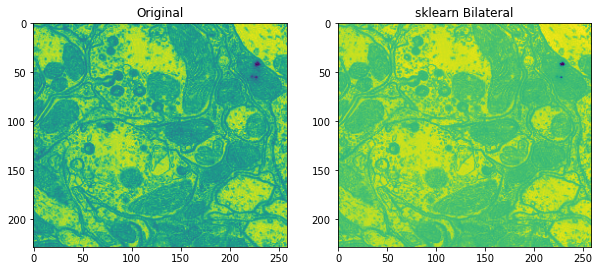

In [16]:
cv_img_bilateral = cv2.bilateralFilter(img,10,20,100) # diameter of the kernal size; sigmaColor, sigmaSpace
com_plots(img, cv_img_bilateral, 'CV2 Bilateral')

from skimage.restoration import denoise_bilateral
bilateral_img = denoise_bilateral(img, sigma_color=20, sigma_spatial=20, multichannel=False)
com_plots(img, bilateral_img, 'sklearn Bilateral')

### Non-Local Means (NLM)

Similar pixel neighborhoods give larger weights

sklearn:

- larger h allows smoothing between disimilar patches


OpenCV:

- cv.fastNlMeansDenoising() - works with a single grayscale images

- cv.fastNlMeansDenoisingColored() - works with a color image.

- cv.fastNlMeansDenoisingMulti() - works with image sequence captured in short period of time (grayscale images)

- cv.fastNlMeansDenoisingColoredMulti() - same as above, but for color images.

Common arguments are:

- h : parameter deciding filter strength. Higher h value removes noise better, but removes details of image also. (10 is ok)

- hForColorComponents : same as h, but for color images only. (normally same as h)
 
- templateWindowSize : should be odd. (recommended 7)

- searchWindowSize : should be odd. (recommended 21)


In [17]:
from skimage.restoration import denoise_nl_means, estimate_sigma
sigma_est = np.mean(estimate_sigma(img, multichannel=False))
NLM_img = denoise_nl_means(img, h=1.5*sigma_est, fast_mode=True, patch_size=5, patch_distance=3, multichannel=False)


<ipython-input-17-a6b6b56cf85b>:3: UserWarning: Image dtype is not float. By default denoise_nl_means will assume you want to preserve the range of your image (preserve_range=True). In scikit-image 0.19 this behavior will change to preserve_range=False. To avoid this warning, explicitly specify the preserve_range parameter.
  NLM_img = denoise_nl_means(img, h=1.5*sigma_est, fast_mode=True, patch_size=5, patch_distance=3, multichannel=False)


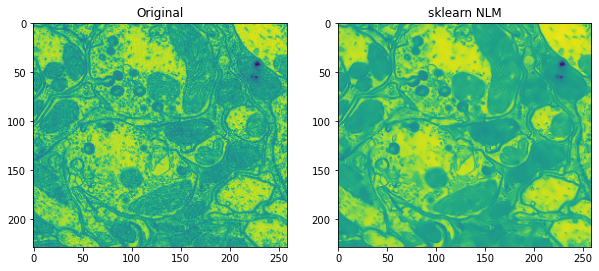

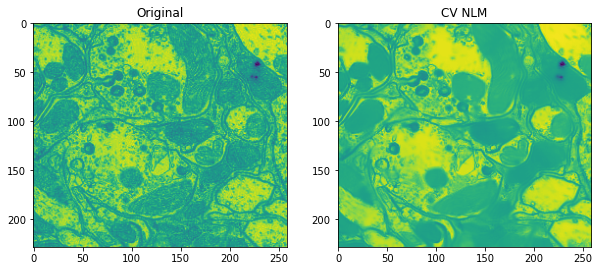

In [18]:
com_plots(img, NLM_img,'sklearn NLM')
cv_img_nlm = cv2.fastNlMeansDenoising(img, h=1.5*sigma_est)
com_plots(img, cv_img_nlm, 'CV NLM')

#### Total Variation Filter (TVF)

- weight: alrger weight more cartoonish, but better denoising

- eps: relative difference of the value of the cost function that determines the stop criterion

- n_iter_max: max number of iterations used for optimization

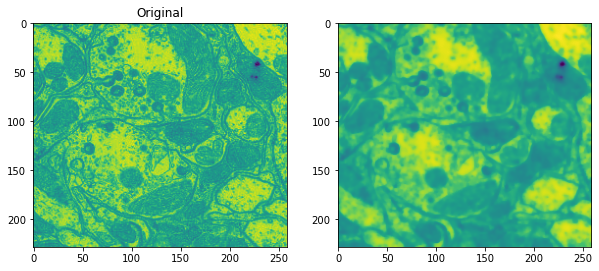

In [19]:
from skimage.restoration import denoise_tv_chambolle
TVF_image = denoise_tv_chambolle(img, weight=0.1, eps=0.0002, n_iter_max=200, multichannel=False)
com_plots(img,TVF_image)

### Block Matching and 3D filtering (BM3D)

- sigma_psd: noise standard deviation

- stage_arg: Determines whether to perform hard-tresholding (BM3DStages.HARD_THRESHOLDING) or Wiener filtering (BM3DStages.ALL_STAGES).

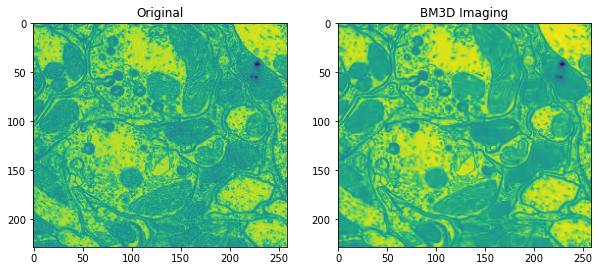

In [20]:
import bm3d
bm3d_img = bm3d.bm3d(img, sigma_psd=8, stage_arg=bm3d.BM3DStages.ALL_STAGES)
com_plots(img,bm3d_img, 'BM3D Imaging')

## Edge Detection

(Sobel filter generally work the best, Canny contain multiple steps, Fourier transform)

### Roberts

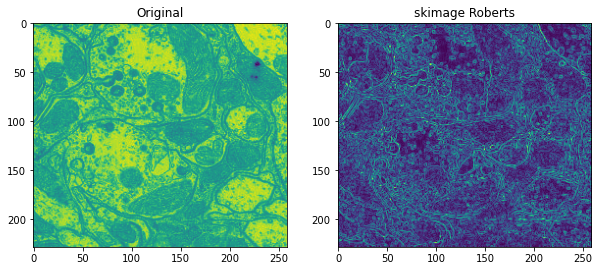

In [21]:
roberts_img=filters.roberts(img)
com_plots(img, roberts_img,'skimage Roberts')

### Sobel

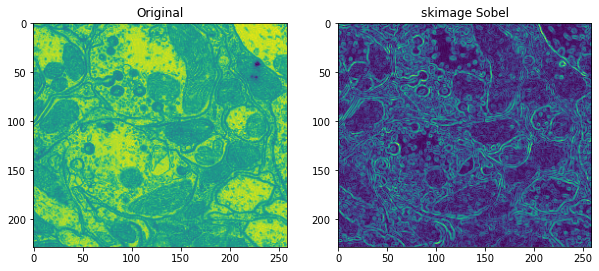

In [22]:
sobel_img = filters.sobel(img)
com_plots(img, sobel_img, "skimage Sobel")

### Scharr

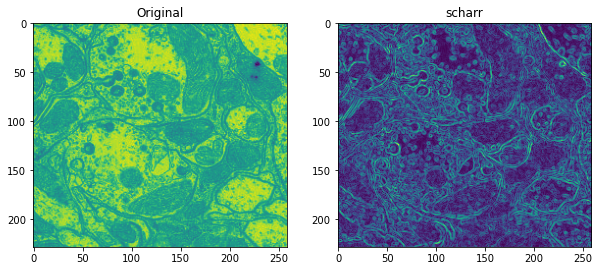

In [23]:
scharr_img = filters.scharr(img)
com_plots(img, scharr_img, 'scharr')

### Prewitt

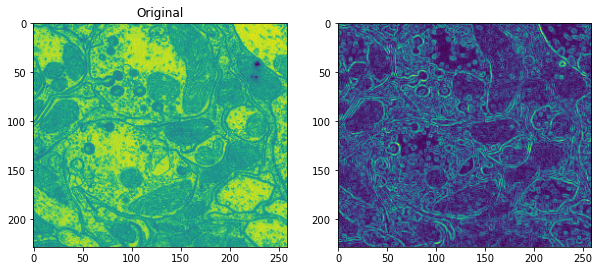

In [24]:
img_prewitt = filters.prewitt(img)
com_plots(img, img_prewitt)

### Farid

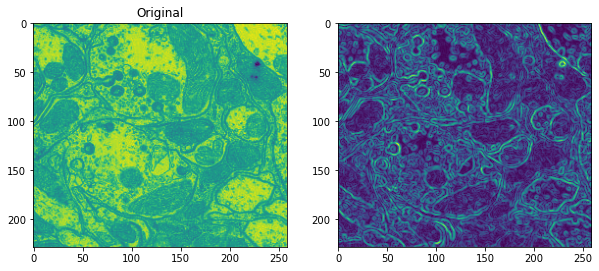

In [25]:
img_farid = filters.farid(img)
com_plots(img, img_farid)

### Canny Edge Detection 

(Multiple Steps)

1. Noise Detection: typically Gaussian
2. Gradient Calculation: detect edge (eg.sobel) horizontal, vertical, and two diagonals
3. Non-maximum supression: thin out edges (avoid double edges) by finding pixels with max value in the edge detection
4. Double threshold: (avoid double edges) determine potential edges by double threholding to obtain strong, weak and irrelevant pixels for edges (throw irrelevant pixels, strong signal is the edge).
5. Edge tracking by hysteresis: convert weak edge pixels to strong based on neighboring pixels.

too much detail, increase lower threshold



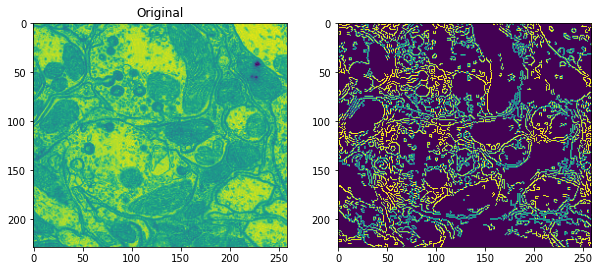

In [26]:
# define threshold
sigma = 0.3
median_val = np.median(img)
lower_val = int(max(0, (1-sigma)*median_val))
upper_val = int(min(255, (1+sigma)*median_val))

# detect edge (Canny Edge detector)
cv_img_Canny=cv2.Canny(img,lower_val, upper_val) #threshold 1 and threshold 2
com_plots(img,cv_img_Canny)

### Fourier Transform

cv2 only works with float32

(120.0, 140.0)

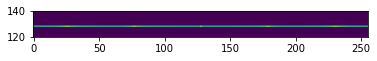

In [27]:
# sin func test
x = np.arange(256)
y = np.sin(2*np.pi*x/5) # 
sin_img = np.array([[y[j]*127 for j in np.arange(256)] for i in np.arange(256)], dtype=np.uint8)

dft = cv2.dft(np.float32(sin_img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
dft_shift_magnitude = 20*np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])+1)

#com_plots(sin_img, dft_shift_magnitude)
plt.imshow(dft_shift_magnitude)
plt.ylim(120,140)

In [28]:
def Fourier_filter(img, mask):
    # fft transfer
    cv2_img_dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT) #transfer, output will be a complex number 
    # shift
    cv2_img_dft_shift = np.fft.fftshift(cv2_img_dft) # shift 0 is real and 1 is imginary

    ## img and tranfered image
    cv2_img_magnitude_spectrum = 20 * np.log( cv2.magnitude(cv2_img_dft_shift[:,:,0],cv2_img_dft_shift[:,:,1])+1 ) # for display only
    com_plots(img,cv2_img_magnitude_spectrum, 'FFT image')

    cv2_img_fshift = mask*cv2_img_dft_shift


    ## magnitude spectrum
    cv2_img_masked = cv2.magnitude(cv2_img_fshift[:,:,0],cv2_img_fshift[:,:,1])
    com_plots(img, cv2_img_masked, 'cv2_img_mask')


    # shift back
    cv2_img_ifshift = np.fft.ifftshift(cv2_img_fshift)
    # inverse dft
    cv2_img_back = cv2.idft(cv2_img_ifshift)
    # magnitude spectrum
    cv2_img_Fourier = cv2.magnitude(cv2_img_back[:,:,0],cv2_img_back[:,:,1])

    return cv2_img_Fourier
    

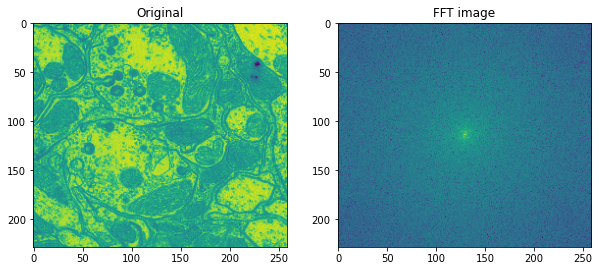

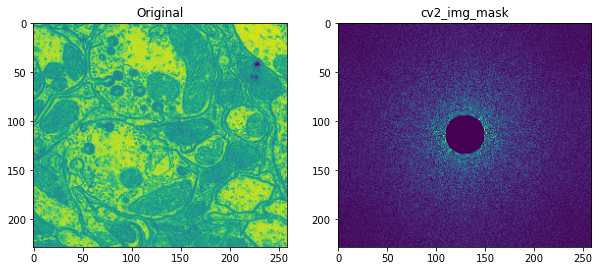

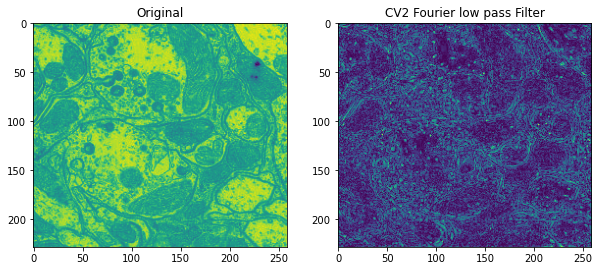

In [29]:
# create mask/filter
center = [int(img.shape[0]/2), int(img.shape[1]/2)]
r = 20
x, y = np.ogrid[:img.shape[0], :img.shape[1]]
mask_area = (x-center[0])**2 + (y-center[1])**2 <= r*r


# low pass filters
low_pass = np.ones((img.shape[0], img.shape[1], 2), np.uint8)
low_pass[mask_area] = 0
cv2_img_Fourier_low = Fourier_filter(img,low_pass)

com_plots(img, cv2_img_Fourier_low, 'CV2 Fourier low pass Filter')

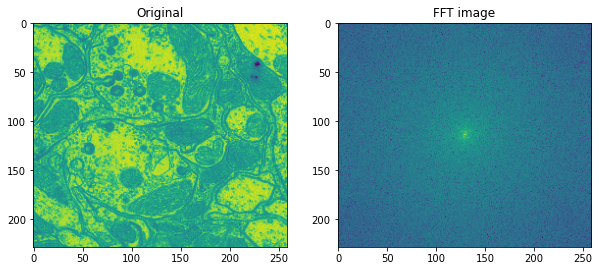

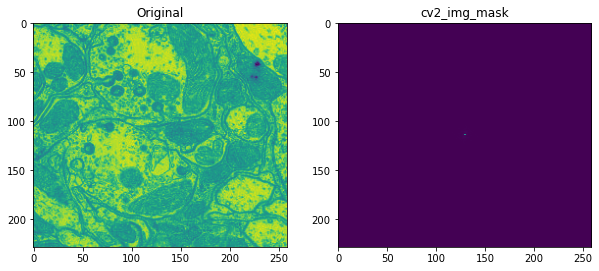

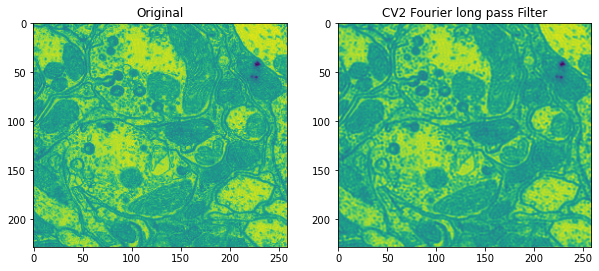

In [30]:
# create mask/filter
center = [int(img.shape[0]/2), int(img.shape[1]/2)]
r = 80
x, y = np.ogrid[:img.shape[0], :img.shape[1]]
mask_area = (x-center[0])**2 + (y-center[1])**2 <= r*r


# long pass filters
long_pass = np.zeros((img.shape[0], img.shape[1], 2), np.uint8)
long_pass[mask_area] = 1

cv2_img_Fourier_long = Fourier_filter(img,long_pass)

com_plots(img, cv2_img_Fourier_long, 'CV2 Fourier long pass Filter')

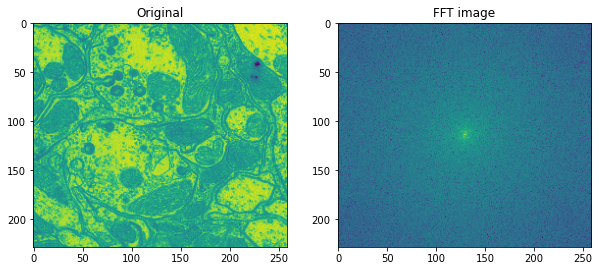

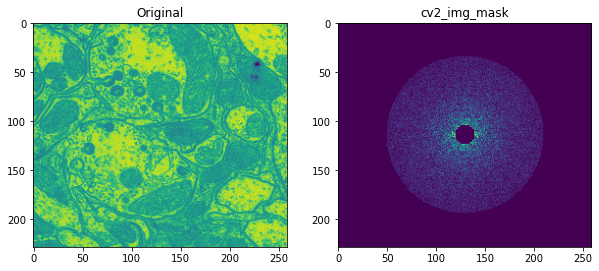

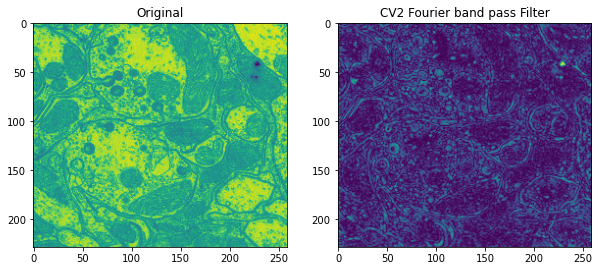

In [31]:

# Band Pass Filter - Concentric circle mask, only the points living in concentric circle are ones
rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)
band_pass = np.zeros((rows, cols, 2), np.uint8)
r_out = 80
r_in = 10
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = np.logical_and(((x - center[0]) ** 2 + (y - center[1]) ** 2 >= r_in ** 2),
                           ((x - center[0]) ** 2 + (y - center[1]) ** 2 <= r_out ** 2))
band_pass[mask_area] = 1


# long pass filters

cv2_img_Fourier_long = Fourier_filter(img,band_pass)
com_plots(img, cv2_img_Fourier_long, 'CV2 Fourier band pass Filter')


## Contrast Enhancement

histogram equalization can lead to extreme bright or dark region

contrast limit adaptive histogram equalization (CLAHE)

In [32]:
# convert to LAB
img_lab = cv2.cvtColor(img_color, cv2.COLOR_BGR2LAB)
# split layers
l, a, b= cv2.split(img_lab)

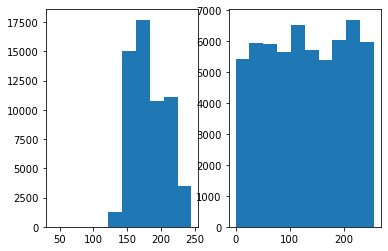

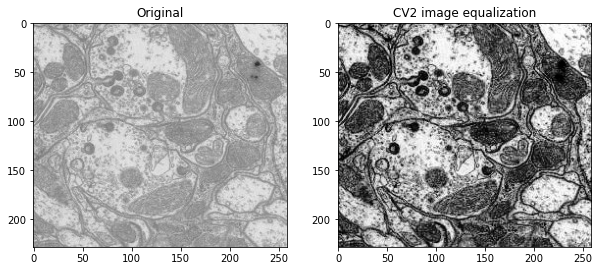

In [33]:
# euqalization
l_equ = cv2.equalizeHist(l)
plt.subplot(1,2,1);  plt.hist(l.flat)
plt.subplot(1,2,2);  plt.hist(l_equ.flat)
plt.show()
cv2_img_equ = cv2.cvtColor(cv2.merge((l_equ, a, b)), cv2.COLOR_LAB2BGR)
com_plots(img_color, cv2_img_equ, 'CV2 image equalization')

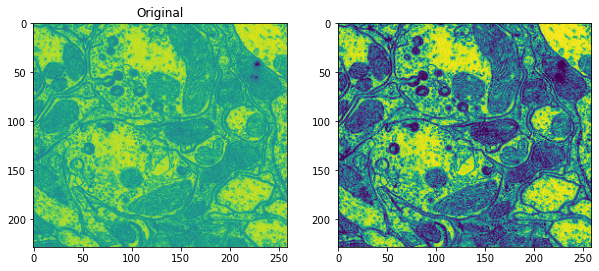

In [34]:
# sklearn euqalization
from skimage.exposure import equalize_hist
equalize_img = equalize_hist(img)
com_plots(img, equalize_img)

### contrast limit adaptive histogram equalization (CLAHE)

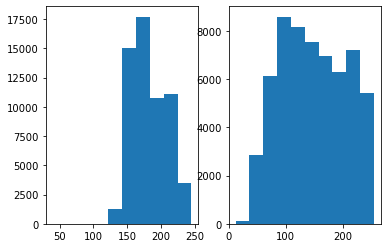

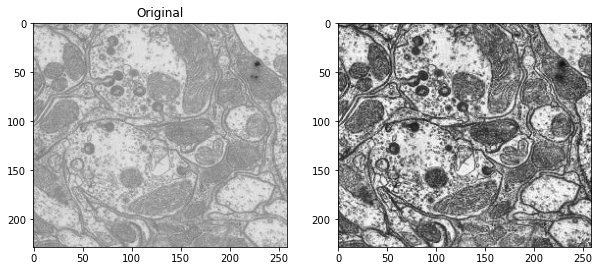

In [35]:
# CLAHE
clahe= cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
l_clahe = clahe.apply(l)
plt.subplot(1,2,1);  plt.hist(l.flat)
plt.subplot(1,2,2);  plt.hist(l_clahe.flat)
plt.show()

cv2_img_clahe =cv2.cvtColor(cv2.merge((l_clahe,a,b)), cv2.COLOR_LAB2BGR)
com_plots(img_color,cv2_img_clahe)

## Shading Correction

useful for partical detection type of application

setting of radius for rolling ball should be larger than feature size, or the feature would be treated as BG


In [36]:
from cv2_rolling_ball import subtract_background_rolling_ball

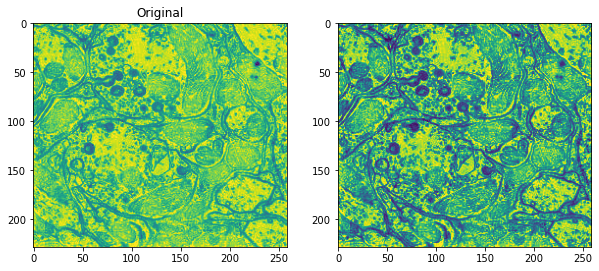

In [37]:
cv2_img_rolling_ball, bg = subtract_background_rolling_ball(img,radius=10, light_background=True, do_presmooth=False, use_paraboloid=False)
com_plots(img, clahe.apply(cv2_img_rolling_ball))

## Image Registration

In [38]:
from scipy.ndimage import shift 
import glob
monalisa_loc = './Image from Kaggle/einstein_mona_lisa/monalisa/'

In [39]:
monalisas = glob.glob(monalisa_loc+'*.jpg')
monalisa_img=[cv2.imread('./Image from Kaggle/einstein_mona_lisa/monalisa_original.jpg',0)]
for monalisa in monalisas:
    monalisa_img.append(cv2.imread(monalisa,0))

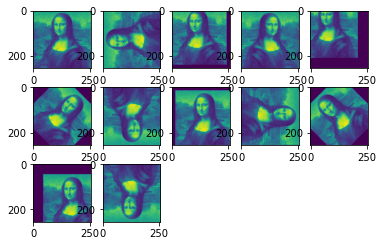

In [40]:
# first is the original one, the rest are shifted/rotate/scaled
for i in range(1,13):
    plt.subplot(3,5,i)
    plt.imshow(monalisa_img[i-1])

### 2D Rigid: Chi2_shift

DFT upsampling methods; input order matters

In [41]:
# import library
from image_registration import chi2_shift

/opt/anaconda3/lib/python3.8/site-packages/image_registration/fft_tools/convolve_nd.py:269: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  bigarray[arrayslices] = array
/opt/anaconda3/lib/python3.8/site-packages/image_registration/fft_tools/convolve_nd.py:270: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  bigkernel[kernslices] = kernel
/opt/anaconda3/lib/python3.8/site-packages/image_registration/fft_tools/convolve_nd.py:325: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instea

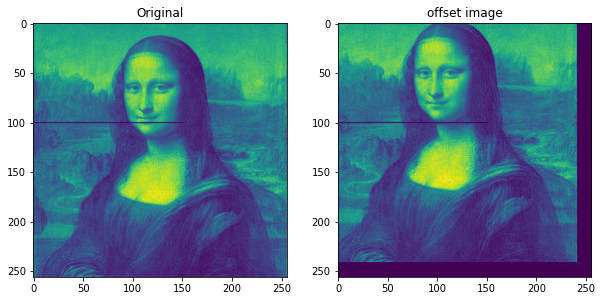

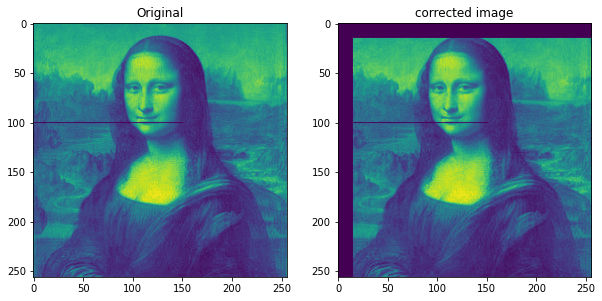

In [42]:
# compare original and offset_image
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(monalisa_img[2].copy(),(0,100),(150,100),(0,255,0),1), 'offset image')

# detect the problem
noise = 0.5
xoff, yoff, exoff, eyoff= chi2_shift(monalisa_img[0],monalisa_img[2], noise, return_error= True, upsample_factor='auto')

# shift off-set image
corrected_image = shift(monalisa_img[2], shift=(-xoff, -yoff), mode='constant')

#compare shifted plots
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(corrected_image.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')


### 2D-Rigid: Cross-Correlation shift

In [43]:
# import library
from image_registration import cross_correlation_shifts 

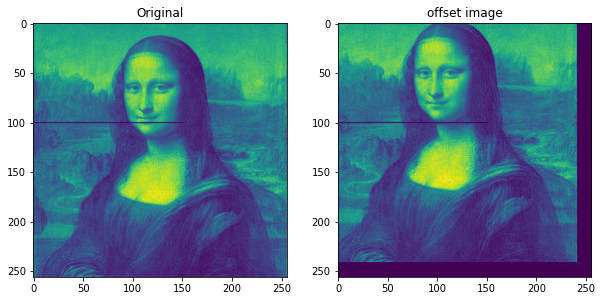

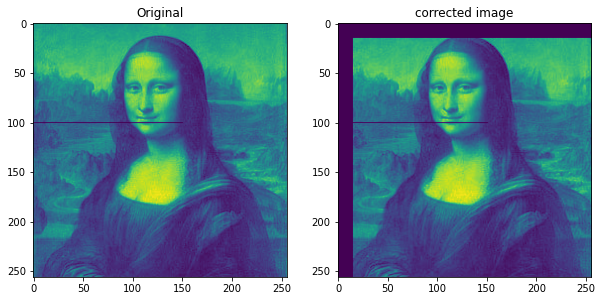

In [44]:
# compare original and offset_image
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(monalisa_img[2].copy(),(0,100),(150,100),(0,255,0),1), 'offset image')

# detect the shift
cross_xoff, cross_yoff= cross_correlation_shifts(monalisa_img[0],monalisa_img[2])

# shift
cross_corrected_image= shift(monalisa_img[2], (-cross_xoff, -cross_yoff), mode = 'constant')

# compare shift results
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(cross_corrected_image.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')


/opt/anaconda3/lib/python3.8/site-packages/skimage/feature/__init__.py:43: skimage_deprecation: Function ``register_translation`` is deprecated and will be removed in version 0.19. Use ``skimage.registration.phase_cross_correlation`` instead.
  removed_version='0.19')


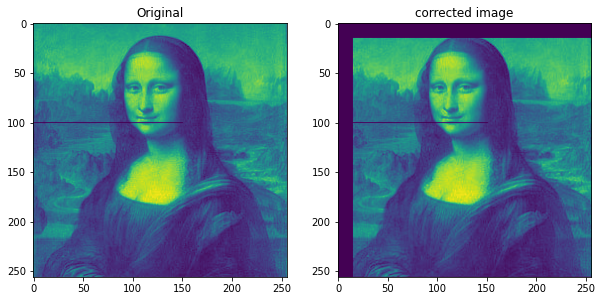

In [45]:
from skimage.feature import register_translation

# detect the shift
shifted, error, diffphase = register_translation(monalisa_img[0],monalisa_img[2],100)

# shift
sklearn_corrected_image= shift(monalisa_img[2], (shifted[0], shifted[1]), mode = 'constant')

# compare shift results
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(sklearn_corrected_image.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')

### Optical Flow

best for warped images

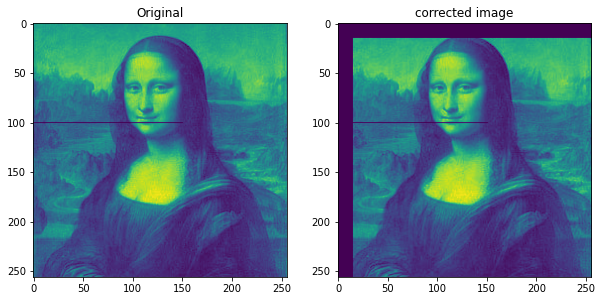

In [46]:
from skimage import registration
flow = registration.optical_flow_tvl1(monalisa_img[0],monalisa_img[1])

#deteect shift
flow_x = flow[1,:,:] # along width
flow_y = flow[0,:,:] # along height

x_off = np.mean(flow_x)
y_off = np.mean(flow_y)

# shift
cross_corrected_image= shift(monalisa_img[2], (-cross_xoff, -cross_yoff), mode = 'constant')

# compare shift results
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(cross_corrected_image.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')


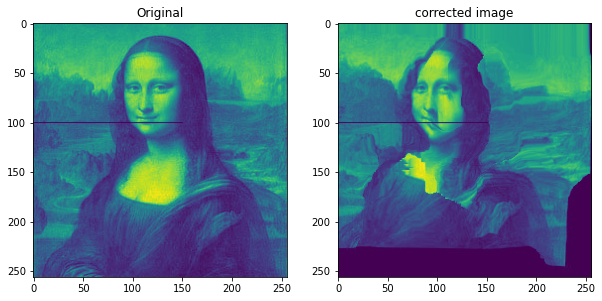

In [47]:
from skimage.transform import warp
height, weight = monalisa_img[0].shape
row_coords, col_coords = np.meshgrid(np.arange(height), np.arange(weight), indexing='ij')
img_warp = warp(monalisa_img[2], np.array([row_coords+flow_y, col_coords+flow_x]), mode='nearest')

com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(img_warp.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')


### pystackreg translation

In [48]:
# import library
from pystackreg import StackReg

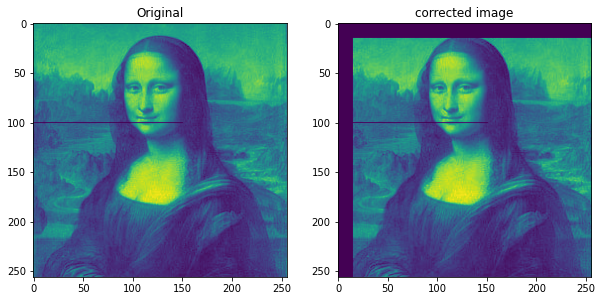

In [49]:
SR_translation = StackReg(StackReg.TRANSLATION)
cv2_img_translation = SR_translation.register_transform(monalisa_img[0],monalisa_img[2])
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(cv2_img_translation.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')

###  pystackreg Scaled Rotation

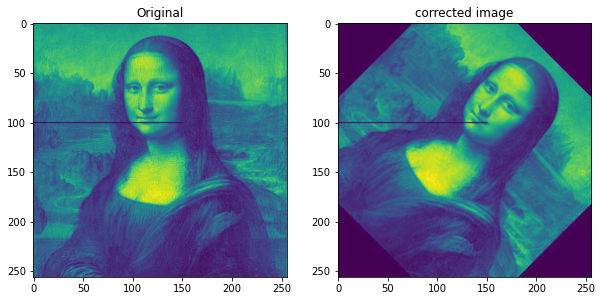

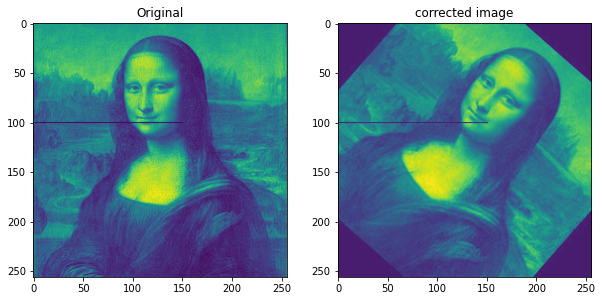

In [50]:
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(monalisa_img[5].copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')

    
SR_rotation = StackReg(StackReg.SCALED_ROTATION)
cv2_img_rotation = SR_rotation.register_transform(monalisa_img[0],monalisa_img[5])
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(cv2_img_rotation.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')

### pystackreg Rigid Body

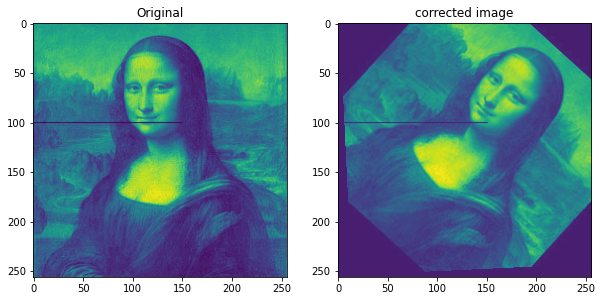

In [51]:
SR_rigid_body = StackReg(StackReg.RIGID_BODY)
cv2_img_rigidbody = SR_rigid_body.register_transform(monalisa_img[0],monalisa_img[5])
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(cv2_img_rigidbody.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')

### pystackreg AFFINE

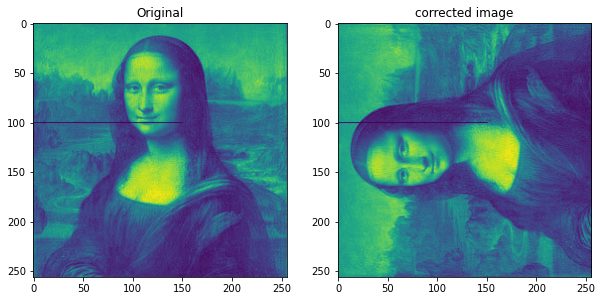

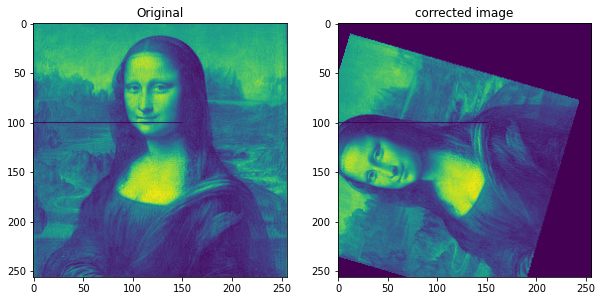

In [52]:
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(monalisa_img[1].copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')

    
SR_affine = StackReg(StackReg.AFFINE)
cv2_img_affine = SR_affine.register_transform(monalisa_img[0],monalisa_img[1])
com_plots( cv2.line(monalisa_img[0].copy(),(0,100),(150,100),(0,255,0),1),
    cv2.line(cv2_img_affine.copy(),(0,100),(150,100),(0,255,0),1), 'corrected image')

### pystackreg Batch processing

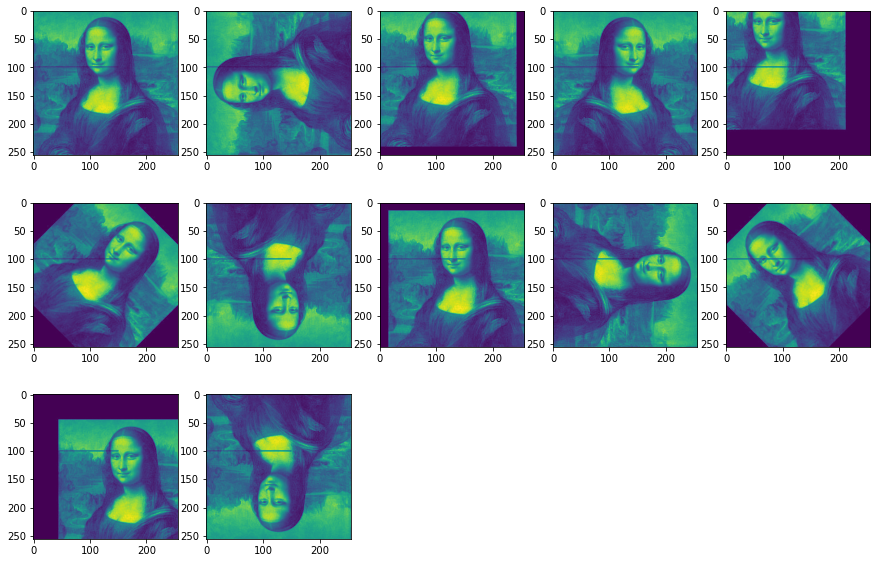

In [53]:
# original pictures
plt.figure(figsize=(15,10))
for i in range(12):
    plt.subplot(3,5,i+1)
    plt.imshow( cv2.line(monalisa_img[i].copy(),(0,100),(150,100),(0,255,0),1) )

/opt/anaconda3/lib/python3.8/site-packages/pystackreg/pystackreg.py:379: UserWarning: Detected axis 2 as the possible time axis for the stack due to its low variability, but axis 0 was supplied for registration. Are you sure you supplied the correct axis?
  warnings.warn(


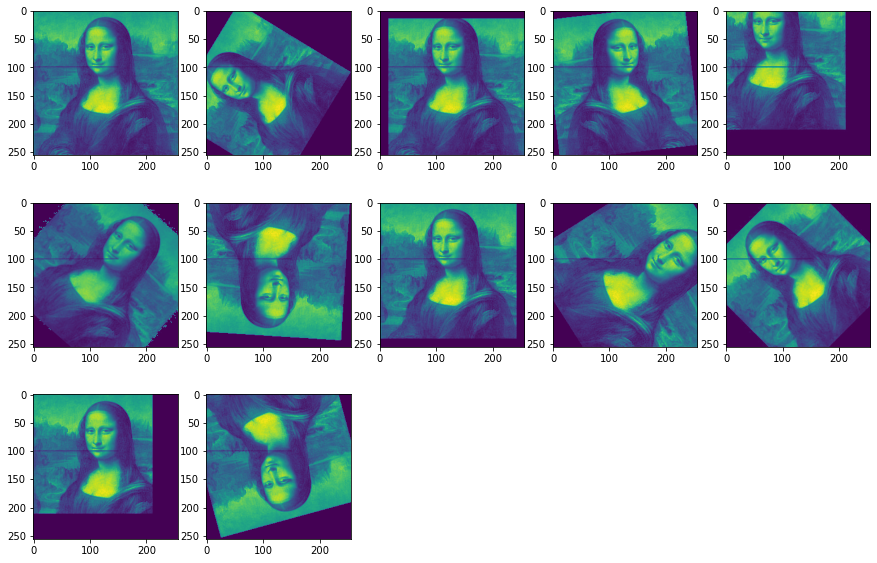

In [54]:
cv2_img_translation_stack = SR_rotation.register_transform_stack(np.array(monalisa_img), reference='first')
cv2_img_translation_stack = cv2_img_translation_stack.astype(np.uint8)

plt.figure(figsize=(15,10))
for i in range(12):
    plt.subplot(3,5,i+1)
    plt.imshow( cv2.line(cv2_img_translation_stack[i,:,:].copy(),(0,100),(150,100),(0,255,0),1) )

## Unsharp Mask

sharpening the image:

original image + n*(original image - blurred image)

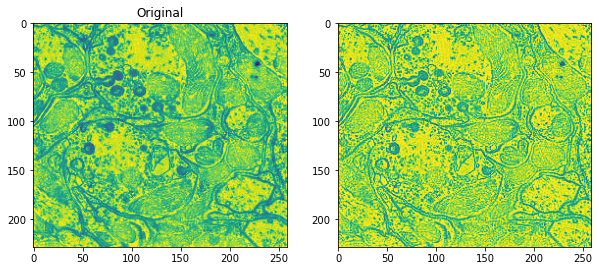

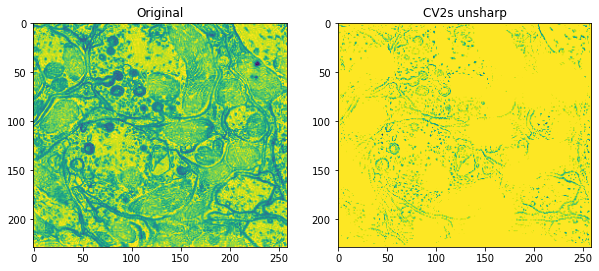

In [55]:
img_unsharp = filters.unsharp_mask(img, radius=1, amount=2)
com_plots(img,img_unsharp)
n=2
cv_img_weight = cv2.addWeighted(img, 1 + n, cv_img_gaussian, -1*n, 0.0) # im1 = im + 3.0*(im - im_blurred)  dst=α⋅src1+β⋅src2+γ (src1, alpha, src2, beta, 0.0) seems alpha only from 0 to 1?
com_plots(img, cv_img_weight, 'CV2s unsharp')

## Image Segmentation

### Thresholding (single)

manual

auto: otsu

Text(0.5, 1.0, 'B')

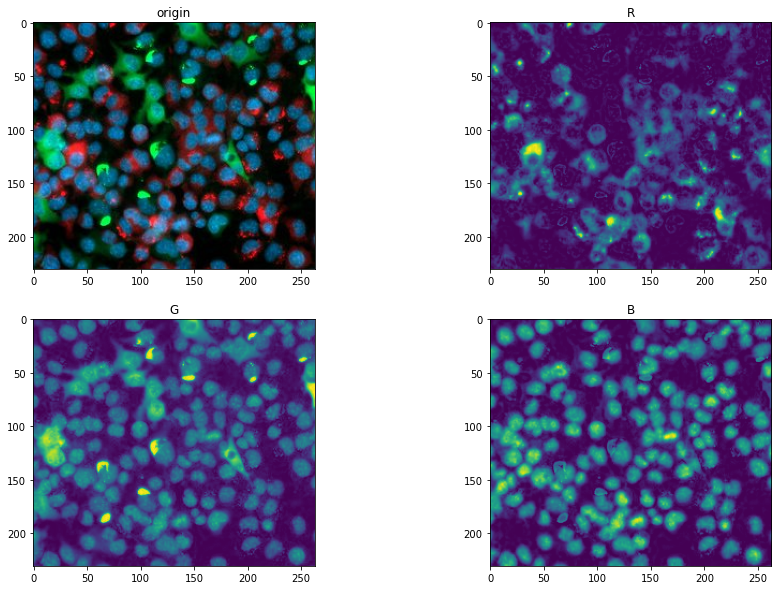

In [56]:
R, G, B= cv2.split(fluorescecne)
plt.figure(figsize=(15,10))
plt.subplot(221); plt.imshow(fluorescecne);plt.title('origin')
plt.subplot(222); plt.imshow(R);plt.title('R')
plt.subplot(223); plt.imshow(G);plt.title('G')
plt.subplot(224); plt.imshow(B);plt.title('B')

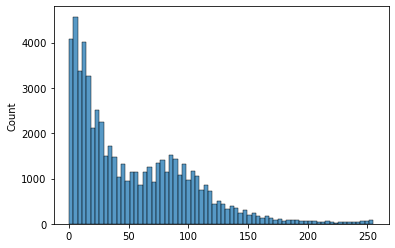

In [57]:
# histogram of Green channel
sns.histplot(G.flat); plt.show()

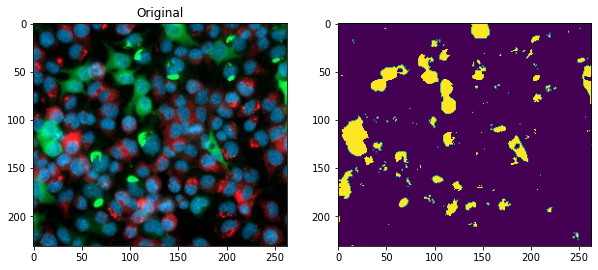

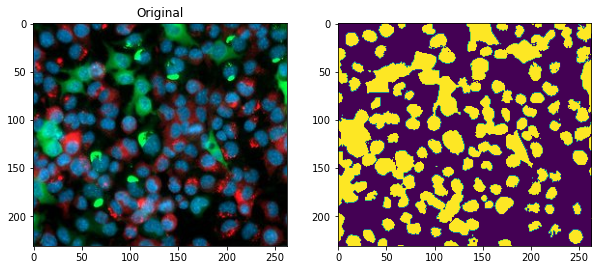

In [58]:
# manual
ret1, threshold1 = cv2.threshold(G, 125, 255, cv2.THRESH_BINARY) #anything above 50 set to 255, ret1 is threshold, threshold 1 is new image
com_plots(fluorescecne, threshold1)

#otsu: auto thresholding
ret2, threshold2 = cv2.threshold(G, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
com_plots(fluorescecne, threshold2)


### Threshold (multiple)
multiotsu from sklearn

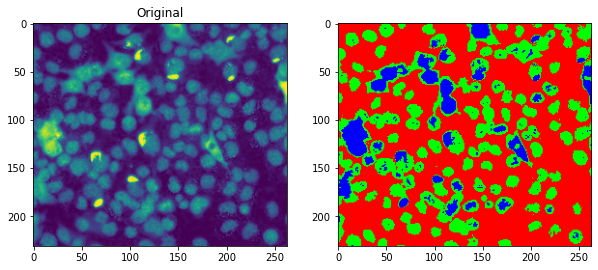

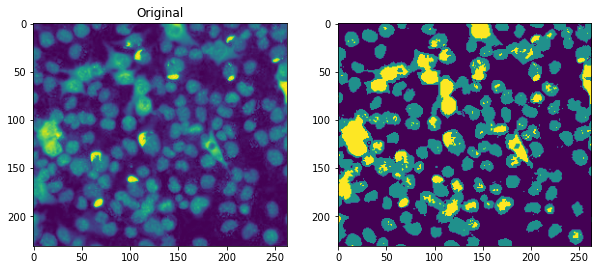

In [59]:
# manual
region1 = (G >= 0) & (G <ret2)
region2 = (G >= ret2) & (G <ret1)
region3 = (G >= ret1) & (G <=255)
all_regions = np.zeros((G.shape[0], G.shape[1], 3)) #Create 3 channel blank image of same size as original
all_regions[region1] = (1,0,0)
all_regions[region2] = (0,1,0)
all_regions[region3] = (0,0,1)
com_plots(G, all_regions)

# auto
thresholds = filters.threshold_multiotsu(G, classes=3)
regions = np.digitize(G, bins=thresholds)
com_plots(G,regions)

### texture segmentation

(spatial distribution of intensity)

- variance (difficult to use)

- Gabor ****

- Entropy *****


In [60]:
scratch = cv2.imread('./Image from Kaggle/scratch_assay/Scratch5.jpg',0)

#### Variance (useless...)

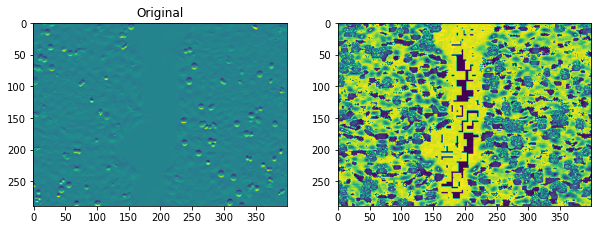

In [61]:
k=7
img_mean = nd.uniform_filter(scratch, (k, k))
img_sqr_mean = nd.uniform_filter(scratch**2, (k, k))
img_var = img_sqr_mean - img_mean**2
com_plots(scratch,img_var)

#### Gabor (need a lot of testing)

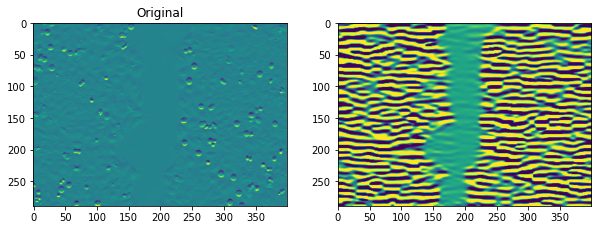

In [62]:
ksize=45
theta=np.pi/2
kernel = cv2.getGaborKernel((ksize, ksize), 5.0, theta, 10.0, 0.9, 0, ktype=cv2.CV_32F)
filtered_image = cv2.filter2D(scratch, cv2.CV_8UC3, kernel)
com_plots(scratch,filtered_image)

#### Entropy

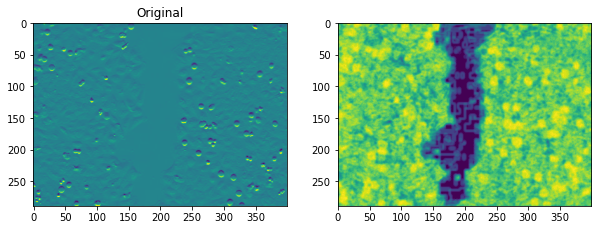

In [63]:
from skimage.filters.rank import entropy
from skimage.morphology import disk
entropy_img = entropy(scratch, disk(3))
com_plots(scratch, entropy_img)

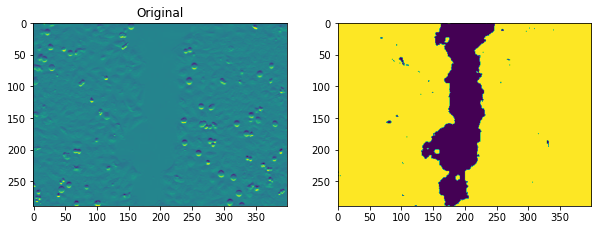

In [64]:
# seperate regions
thres = filters.threshold_multiotsu(entropy_img, classes=2)
otsu_entropy_img = np.digitize(entropy_img, bins=np.array(thres))
com_plots(scratch, otsu_entropy_img)

### Based on Properties of connected area

threshold - (clean border) - connected area - regionprops

In [65]:
# import measure from skimage
from skimage import measure
from skimage.color import label2rgb
from skimage.segmentation import clear_border

<ipython-input-66-389607b6cc15>:6: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  G_labeled_RGB = label2rgb(G_labeled, image=G_binary) # iamge work like a background


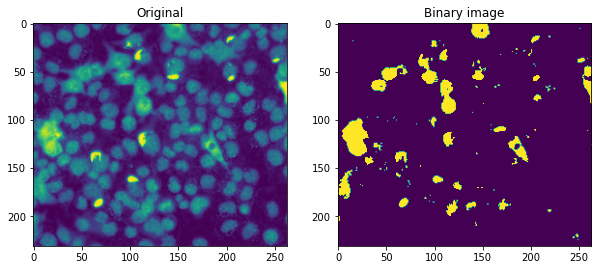

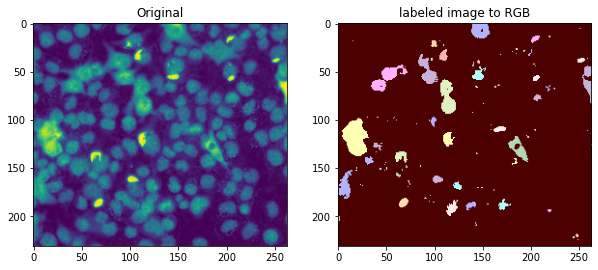

In [66]:
# geneate binary image with islands
_, G_binary= cv2.threshold(G, 130, 255, cv2.THRESH_BINARY)
com_plots(G, G_binary, 'Binary image')
#label and label to RGB
G_labeled = measure.label(G_binary, connectivity=G_binary.ndim)
G_labeled_RGB = label2rgb(G_labeled, image=G_binary) # iamge work like a background
com_plots(G, G_labeled_RGB, 'labeled image to RGB')

In [67]:
# region properties
props = measure.regionprops_table(G_labeled, G, properties=['label', 'area', 'equivalent_diameter', 'mean_intensity', 'solidity'])
pd.DataFrame(props)

,label,area,equivalent_diameter,mean_intensity,solidity
0,1,252,17.912464,155.988095,0.940299
1,2,1,1.128379,143.000000,1.000000
2,3,42,7.312733,202.023810,0.913043
3,4,4,2.256758,136.500000,1.000000
4,5,1,1.128379,131.000000,1.000000
...,...,...,...,...,...
93,94,11,3.742410,149.454545,1.000000
94,95,5,2.523133,136.800000,0.714286
95,96,9,3.385138,138.333333,1.000000
96,97,4,2.256758,131.750000,1.000000


### Blob Detection (Binary Large Object)

segment based on feature properties

In [68]:
params = cv2.SimpleBlobDetector_Params()

In [69]:
# Define thresholds
#Can define thresholdStep. See documentation. 
params.minThreshold = 0
params.maxThreshold = 255

# Filter by Area.
params.filterByArea = True
params.minArea = 50
params.maxArea = 10000

# Filter by Color (black=0)
params.filterByColor = False  #Set true for cast_iron as we'll be detecting black regions
params.blobColor = 0

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.5
params.maxCircularity = 1

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.5
params.maxConvexity = 1

# Filter by InertiaRatio
params.filterByInertia = True
params.minInertiaRatio = 0
params.maxInertiaRatio = 1

# Distance Between Blobs
params.minDistBetweenBlobs = 0


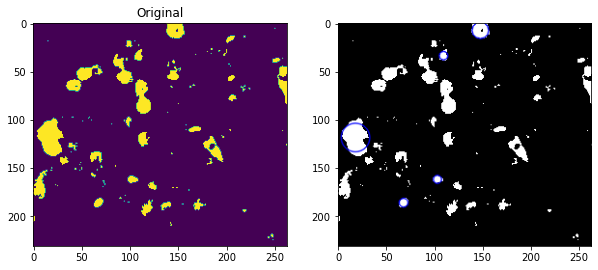

In [70]:
# Setup the detector with parameters
detector = cv2.SimpleBlobDetector_create(params)

# Detect blobs
keypoints = detector.detect(G_binary)

# draw key points
blob_img = cv2.drawKeypoints(G_binary, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ) # image, keypoints, color

# identify the area
com_plots(G_binary, blob_img)

similar ones including half circle and straight lines

### Watershed

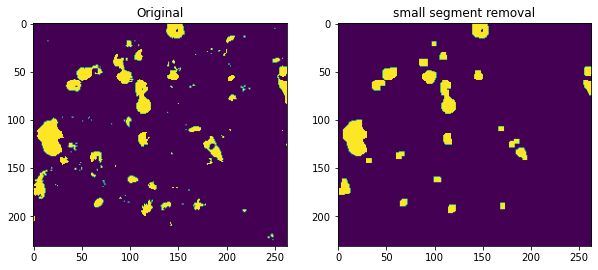

In [71]:
# remove small ones
kernel = np.ones((3,3), np.uint8)
open_G_binary= cv2.morphologyEx(G_binary, cv2.MORPH_OPEN, kernel, iterations=2)
com_plots(G_binary, open_G_binary, 'small segment removal')


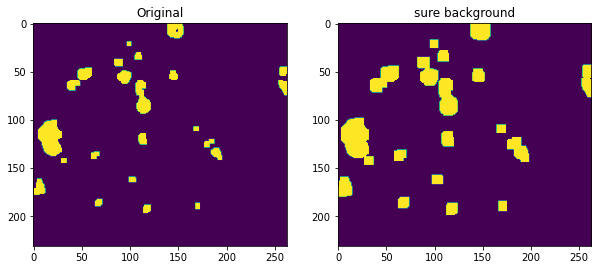

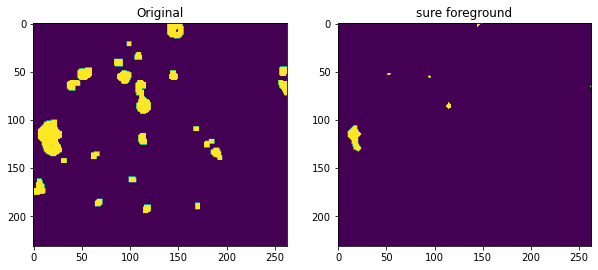

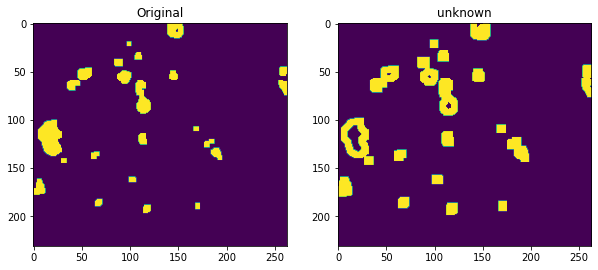

In [72]:
# generate sure BG
sure_bg = cv2.dilate(open_G_binary,kernel,iterations=2)
com_plots(open_G_binary, sure_bg, 'sure background')

# generate sure foreground
# erosion: may lose small regions  # distance transformation; center is bright and outside is darker
dist_transform = cv2.distanceTransform(open_G_binary, cv2.DIST_L2, 5)
_, dist_transform_binary = cv2.threshold(dist_transform, dist_transform.max()*0.5, 255, 0)
dist_transform_binary = dist_transform_binary.astype(np.uint8)
com_plots(open_G_binary, dist_transform_binary, 'sure foreground')

# unknown
unknown = cv2.subtract(sure_bg, dist_transform_binary)
com_plots(open_G_binary, unknown, 'unknown')


Connected components labeling scans an image and groups its pixels into components 
based on pixel connectivity, i.e. all pixels in a connected component share 
similar pixel intensity values and are in some way connected with each other. 
Once all groups have been determined, each pixel is labeled with a graylevel 
 or a color (color labeling) according to the component it was assigned to.

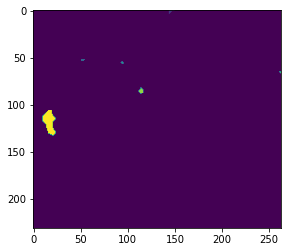

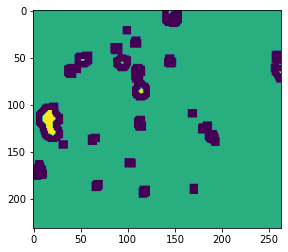

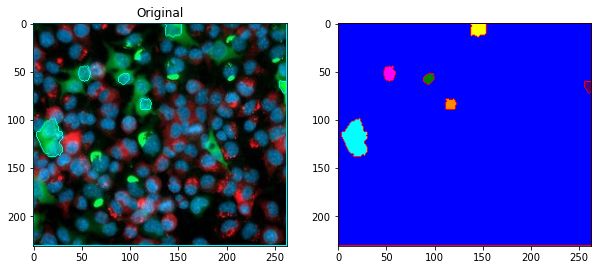

In [73]:
# watershed
_, marker = cv2.connectedComponents(dist_transform_binary)
plt.figure()
plt.imshow(marker)

marker= marker + 10
marker[unknown==255] = 0
plt.figure()
plt.imshow(marker)

open_G_binary = cv2.cvtColor(open_G_binary,cv2.COLOR_GRAY2BGR)
marker = cv2.watershed(fluorescecne, marker) # the first image must have 3 channels
fluorescecne_copy = fluorescecne.copy()
fluorescecne_copy[marker == -1] = [0,255,255]

img_watershed = label2rgb(marker, bg_label=0)
com_plots(fluorescecne_copy,img_watershed)

## Object detection (scale fixed template matching)

for various size, machine learning seems to be a better method


In [74]:
"""
OBJECT DETECTION WITH TEMPLATES
Need a source image and a template image.
The template image T is slided over the source image (as in 2D convolution), 
and the program tries to find matches using statistics.
Several comparison methods are implemented in OpenCV.
It returns a grayscale image, where each pixel denotes how much does the 
neighbourhood of that pixel match with template.
Once you got the result, you can use cv2.minMaxLoc() function 
to find where is the maximum/minimum value. Take it as the top-left corner of the 
rectangle and take (w,h) as width and height of the rectangle. 
That rectangle can be drawn on the region of matched template.
"""
### Template matching, single object in an image.
#Multiple methods to see which one works best. 

import cv2
import numpy as np
from matplotlib import pyplot as plt

img_rgb = cv2.imread('images/Ti_powder.tif')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
template = cv2.imread('images/Ti_powder_single.tif', 0)
h, w = template.shape[::] 

#methods available: ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
#            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

res = cv2.matchTemplate(img_gray, template, cv2.TM_SQDIFF)
# For TM_SQDIFF, Good match yields minimum value; bad match yields large values
# For all others it is exactly opposite, max value = good fit.
plt.imshow(res, cmap='gray')

min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

top_left = min_loc  #Change to max_loc for all except for TM_SQDIFF
bottom_right = (top_left[0] + w, top_left[1] + h)

cv2.rectangle(img_gray, top_left, bottom_right, 0, 1)  #Black rectangle with thickness 2. 

cv2.imshow("Matched image", img_gray)
cv2.waitKey()
cv2.destroyAllWindows()

       
### Template matching - multiple objects

#For multiple occurances, cv2.minMaxLoc() won’t give all the locations
#So we need to set a threshold
    
import cv2
import numpy as np
from matplotlib import pyplot as plt

img_rgb = cv2.imread('images/Ti_powder.tif')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
template = cv2.imread('images/Ti_powder_single.tif',0)
h, w = template.shape[::]

res = cv2.matchTemplate(img_gray, template, cv2.TM_CCOEFF_NORMED)
plt.imshow(res, cmap='gray')

threshold = 0.8 #Pick only values above 0.8. For TM_CCOEFF_NORMED, larger values = good fit.

loc = np.where( res >= threshold)  
#Outputs 2 arrays. Combine these arrays to get x,y coordinates - take x from one array and y from the other.

#Reminder: ZIP function is an iterator of tuples where first item in each iterator is paired together,
#then the second item and then third, etc. 

for pt in zip(*loc[::-1]):   #-1 to swap the values as we assign x and y coordinate to draw the rectangle. 
    #Draw rectangle around each object. We know the top left (pt), draw rectangle to match the size of the template image.
    cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0, 0, 255), 1)  #Red rectangles with thickness 2. 

error: OpenCV(4.5.3) /private/var/folders/24/8k48jl6d249_n_qfxwsl6xvm0000gn/T/pip-req-build-xxsyexfp/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


## Gabor Filter

In [ ]:
cv2.getGaborKernal()

TypeError: Image data of dtype object cannot be converted to float

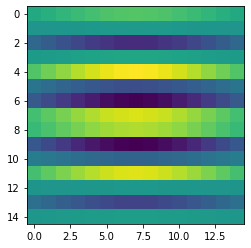

In [ ]:
"""
WHat is Gabor filter?
"""

##############################################
#Gabor filter, multiple filters in one. Generate fiter bank. 
"""
For image processing and computer vision, Gabor filters are generally 
used in texture analysis, edge detection, feature extraction, etc. 
Gabor filters are special classes of bandpass filters, i.e., they allow a certain 
‘band’ of frequencies and reject the others.
ksize Size of the filter returned.
sigma Standard deviation of the gaussian envelope.
theta Orientation of the normal to the parallel stripes of a Gabor function.
lambda Wavelength of the sinusoidal factor.
gamma Spatial aspect ratio.
psi Phase offset.
ktype Type of filter coefficients. It can be CV_32F or CV_64F.
indicates the type and range of values that each pixel in the Gabor kernel can hold.
Basically float32 or float64
"""

import numpy as np
import cv2
import matplotlib.pyplot as plt

ksize = 15  #Use size that makes sense to the image and fetaure size. Large may not be good. 
#On the synthetic image it is clear how ksize affects imgae (try 5 and 50)
sigma = 5 #Large sigma on small features will fully miss the features. 
theta = 1*np.pi/2  #/4 shows horizontal 3/4 shows other horizontal. Try other contributions
lamda = 1*np.pi/4  #1/4 works best for angled. 
gamma=0.9  #Value of 1 defines spherical. Calue close to 0 has high aspect ratio
#Value of 1, spherical may not be ideal as it picks up features from other regions.
phi = 0.8  #Phase offset. I leave it to 0. (For hidden pic use 0.8)


kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, phi, ktype=cv2.CV_32F)

plt.imshow(kernel)

#img = cv2.imread('images/synthetic.jpg')
#img = cv2.imread('images/zebra.jpg')  #Image source wikipedia: https://en.wikipedia.org/wiki/Plains_zebra
img = cv2.imread('images/hidden.jpg') #USe ksize:15, s:5, q:pi/2, l:pi/4, g:0.9, phi:0.8
plt.imshow(img, cmap='gray')

img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
fimg = cv2.filter2D(img, cv2.CV_8UC3, kernel)

kernel_resized = cv2.resize(kernel, (400, 400))                    # Resize image


plt.imshow(kernel_resized)
plt.imshow(fimg, cmap='gray')

#cv2.imshow('Kernel', kernel_resized)
#cv2.imshow('Original Img.', img)
#cv2.imshow('Filtered', fimg)
#cv2.waitKey()
#cv2.destroyAllWindows()


## Feature Selection

In [ ]:
from boruta import BorutaPy

In [ ]:
# Boruta
X_Boruta, _, y_Boruta, _=train_test_split(X_train, y_train, test_size=0.2)

In [ ]:
feature_selector = BorutaPy(md, n_estimators=, verbose=, random_state=, max_iter=)

In [ ]:
feature_selector.fit(X_Boruta, y_Boruta)
print(feature_selector.support_)
print(feature_selector.ranking_)


In [ ]:
feature_selector.transform(X_train)
feature_selector.transform(X_test)